In [1]:
! pip install yfinance

Defaulting to user installation because normal site-packages is not writeable


In [2]:
import yfinance as yf
import pandas as pd
from concurrent.futures import ThreadPoolExecutor, as_completed  # Import ThreadPoolExecutor

RuntimeError: module was compiled against NumPy C-API version 0x10 (NumPy 1.23) but the running NumPy has C-API version 0xe. Check the section C-API incompatibility at the Troubleshooting ImportError section at https://numpy.org/devdocs/user/troubleshooting-importerror.html#c-api-incompatibility for indications on how to solve this problem.

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [4]:
# Step 1: Load tickers from a CSV file
tickers_df = pd.read_csv('Tickers.csv')  # Ensure this file contains updated tickers
tickers = tickers_df['Ticker'].tolist()  # Adjust based on the column name in your CSV

In [5]:
tickers

['RELIANCE.NS',
 'TCS.NS',
 'INFY.BO',
 'HDFCBANK.BO',
 'ICICIBANK.BO',
 'ADANIPOWER.BO',
 'APOLLOHOSP.BO',
 'HEROMOTOCO.BO',
 'MARUTI.BO',
 'BHARTIARTL.NS']

In [6]:
start_date = "2014-09-30"
end_date = "2024-09-30"
# Download historical data for each ticker without specifying date range
data = yf.download(tickers, start=start_date, end=end_date, progress=False, auto_adjust=False)
stock_data = data.stack(level=1).reset_index()
# Rename columns to make it more clear
stock_data.columns = ['Date', 'Ticker', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']


In [7]:
stock_data.head()

,Date,Ticker,Open,High,Low,Close,Adj Close,Volume
0,2014-09-30,ADANIPOWER.BO,43.400002,43.400002,45.200001,43.200001,44.400002,848909.0
1,2014-09-30,APOLLOHOSP.BO,1080.492554,1120.650024,1134.000000,1089.750000,1091.650024,14555.0
2,2014-09-30,BHARTIARTL.NS,346.858582,365.189453,368.569153,361.404175,363.432007,4148252.0
3,2014-09-30,HDFCBANK.BO,388.320587,435.750000,440.000000,431.000000,432.500000,986976.0
4,2014-09-30,HEROMOTOCO.BO,2081.102783,2842.050049,2920.000000,2825.300049,2865.000000,48106.0


In [8]:
stock_data['Ticker'].value_counts()

BHARTIARTL.NS    2463
RELIANCE.NS      2463
TCS.NS           2463
HDFCBANK.BO      2441
INFY.BO          2441
MARUTI.BO        2439
ADANIPOWER.BO    2438
APOLLOHOSP.BO    2438
HEROMOTOCO.BO    2438
ICICIBANK.BO     2438
Name: Ticker, dtype: int64

In [9]:
stock_data.tail()

,Date,Ticker,Open,High,Low,Close,Adj Close,Volume
24457,2024-09-27,ICICIBANK.BO,1306.500000,1306.500000,1332.000000,1303.050049,1331.400024,218203.0
24458,2024-09-27,INFY.BO,1885.739136,1907.199951,1974.650024,1903.300049,1930.000000,262993.0
24459,2024-09-27,MARUTI.BO,13497.349609,13497.349609,13539.849609,13275.049805,13409.750000,25239.0
24460,2024-09-27,RELIANCE.NS,1526.175049,1526.175049,1533.474976,1492.000000,1499.000000,20597478.0
24461,2024-09-27,TCS.NS,4230.771973,4308.700195,4378.000000,4300.049805,4335.000000,3012477.0


In [10]:
s_data = stock_data.copy()

In [11]:
# View dimensions of dataset   
rows, col = stock_data.shape
print ("Dimensions of dataset: {}" . format (stock_data.shape))
print ('Rows:', rows, '\nColumns:', col)

Dimensions of dataset: (24462, 8)
Rows: 24462 
Columns: 8


In [12]:
# Dtype
print(f'The data type contains:\n object --> {stock_data.dtypes.value_counts()[1]}\n float64 --> {stock_data.dtypes.value_counts()[0]}')

The data type contains:
 object --> 1
 float64 --> 6


In [13]:
stock_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24462 entries, 0 to 24461
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       24462 non-null  datetime64[ns]
 1   Ticker     24462 non-null  object        
 2   Open       24462 non-null  float64       
 3   High       24462 non-null  float64       
 4   Low        24462 non-null  float64       
 5   Close      24462 non-null  float64       
 6   Adj Close  24462 non-null  float64       
 7   Volume     24462 non-null  float64       
dtypes: datetime64[ns](1), float64(6), object(1)
memory usage: 1.5+ MB


In [14]:
float_cols = stock_data.columns.drop(["Ticker","Date"])
stock_data[float_cols] = stock_data[float_cols].round().astype("Int64")
stock_data.head()

,Date,Ticker,Open,High,Low,Close,Adj Close,Volume
0,2014-09-30,ADANIPOWER.BO,43,43,45,43,44,848909
1,2014-09-30,APOLLOHOSP.BO,1080,1121,1134,1090,1092,14555
2,2014-09-30,BHARTIARTL.NS,347,365,369,361,363,4148252
3,2014-09-30,HDFCBANK.BO,388,436,440,431,432,986976
4,2014-09-30,HEROMOTOCO.BO,2081,2842,2920,2825,2865,48106


In [15]:
stock_data.sort_values(by="Date").head()

,Date,Ticker,Open,High,Low,Close,Adj Close,Volume
0,2014-09-30,ADANIPOWER.BO,43,43,45,43,44,848909
1,2014-09-30,APOLLOHOSP.BO,1080,1121,1134,1090,1092,14555
2,2014-09-30,BHARTIARTL.NS,347,365,369,361,363,4148252
3,2014-09-30,HDFCBANK.BO,388,436,440,431,432,986976
4,2014-09-30,HEROMOTOCO.BO,2081,2842,2920,2825,2865,48106


In [16]:
stock_data1 = stock_data[(stock_data['Ticker'] == 'RELIANCE.NS')]    
stock_data1.head()

,Date,Ticker,Open,High,Low,Close,Adj Close,Volume
8,2014-09-30,RELIANCE.NS,200,216,217,211,212,17642155
18,2014-10-01,RELIANCE.NS,196,212,216,212,216,8656245
28,2014-10-07,RELIANCE.NS,196,212,214,211,212,12404189
38,2014-10-08,RELIANCE.NS,198,214,215,211,211,9827783
48,2014-10-09,RELIANCE.NS,202,218,219,214,214,11164671


In [17]:
# View dimensions of dataset   
rows, col = stock_data1.shape
print ("Dimensions of dataset: {}" . format (stock_data1.shape))
print ('Rows:', rows, '\nColumns:', col)

Dimensions of dataset: (2463, 8)
Rows: 2463 
Columns: 8


In [18]:
# Dtype
print(f'The data type contains:\n object --> {stock_data1.dtypes.value_counts()[1]}\n float64 --> {stock_data1.dtypes.value_counts()[0]}')

The data type contains:
 object --> 1
 float64 --> 6


In [19]:
stock_data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2463 entries, 8 to 24460
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       2463 non-null   datetime64[ns]
 1   Ticker     2463 non-null   object        
 2   Open       2463 non-null   Int64         
 3   High       2463 non-null   Int64         
 4   Low        2463 non-null   Int64         
 5   Close      2463 non-null   Int64         
 6   Adj Close  2463 non-null   Int64         
 7   Volume     2463 non-null   Int64         
dtypes: Int64(6), datetime64[ns](1), object(1)
memory usage: 187.6+ KB


In [20]:
stock_data2 = stock_data1.copy()

In [21]:
# Dtype
print(f'The data type contains:\n object --> {stock_data2.dtypes.value_counts()[1]}\n int64 --> {stock_data2.dtypes.value_counts()[0]}')

The data type contains:
 object --> 1
 int64 --> 6


In [22]:
stock_data2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2463 entries, 8 to 24460
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       2463 non-null   datetime64[ns]
 1   Ticker     2463 non-null   object        
 2   Open       2463 non-null   Int64         
 3   High       2463 non-null   Int64         
 4   Low        2463 non-null   Int64         
 5   Close      2463 non-null   Int64         
 6   Adj Close  2463 non-null   Int64         
 7   Volume     2463 non-null   Int64         
dtypes: Int64(6), datetime64[ns](1), object(1)
memory usage: 187.6+ KB


In [23]:
stock_data2.sort_values(by="Date").head()

,Date,Ticker,Open,High,Low,Close,Adj Close,Volume
8,2014-09-30,RELIANCE.NS,200,216,217,211,212,17642155
18,2014-10-01,RELIANCE.NS,196,212,216,212,216,8656245
28,2014-10-07,RELIANCE.NS,196,212,214,211,212,12404189
38,2014-10-08,RELIANCE.NS,198,214,215,211,211,9827783
48,2014-10-09,RELIANCE.NS,202,218,219,214,214,11164671


In [24]:
# Plotting count plot by year
Year = stock_data2['Date'].dt.year

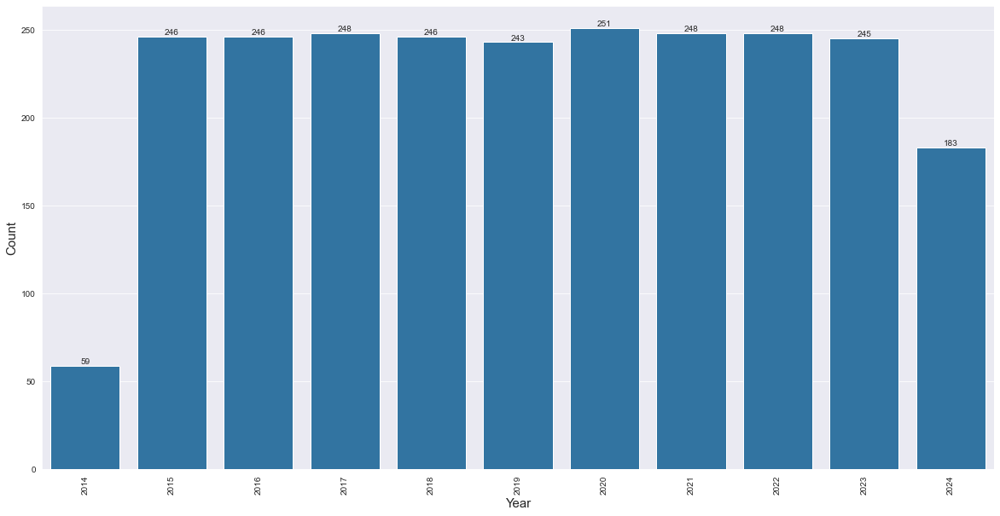

In [25]:
plt.figure(figsize = (20, 10))
sns.set_style('darkgrid')
ax=sns.countplot(data=stock_data2, x=Year)
for cont in ax.containers:
    ax.bar_label(cont)
plt.ylabel("Count", fontsize= 15)
plt.xlabel("Year", fontsize= 15)
plt.xticks(rotation=90)
plt.show()

In [26]:
# Identify the labels (index) of rows where the year is 2014
labels_to_drop = stock_data2[stock_data2['Date'].dt.year == 2014].index

# Drop the rows corresponding to 2014 using the labels
stock_data3 = stock_data2.drop(labels=labels_to_drop, axis=0)

In [27]:
stock_data.head()

,Date,Ticker,Open,High,Low,Close,Adj Close,Volume
0,2014-09-30,ADANIPOWER.BO,43,43,45,43,44,848909
1,2014-09-30,APOLLOHOSP.BO,1080,1121,1134,1090,1092,14555
2,2014-09-30,BHARTIARTL.NS,347,365,369,361,363,4148252
3,2014-09-30,HDFCBANK.BO,388,436,440,431,432,986976
4,2014-09-30,HEROMOTOCO.BO,2081,2842,2920,2825,2865,48106


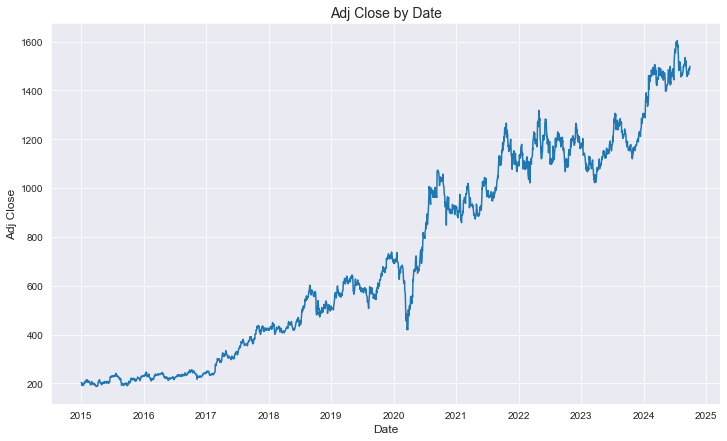

In [28]:
# Plotting the target-date linear graph
plt.figure(figsize=(12, 7))
sns.lineplot(data=stock_data3, x="Date", y="Adj Close")
plt.title("Adj Close by Date", fontsize=14)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Adj Close", fontsize=12)
plt.grid(True)
plt.show()

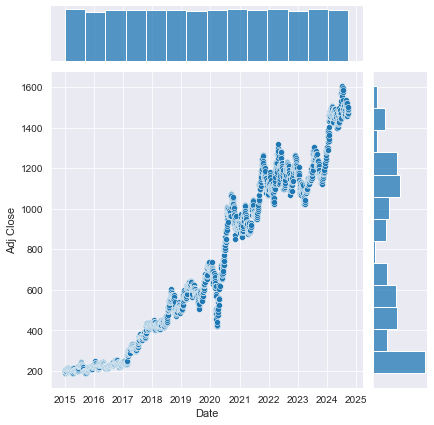

In [29]:
# Target-Date
sns.jointplot(data=stock_data3, x="Date", y="Adj Close")
sns.set_style('darkgrid')
plt.ylabel("Adj Close", fontsize=11)
plt.xlabel("Date", fontsize=11)
plt.show()

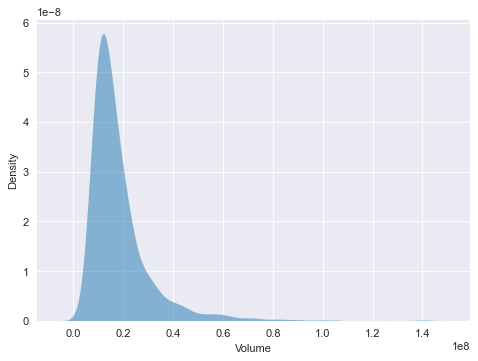

In [30]:
# The data distribution in "Volume"
plt.figure(figsize=(7,5), dpi=80)
sns.kdeplot(data=stock_data3, x="Volume", fill=True, common_norm=False,
            palette="crest", alpha=.5, linewidth=0)
plt.show()

In [31]:
# Assessing the 0 values of the "Volume" column
len(stock_data3[stock_data3["Volume"]==0])

0

In [32]:
# Plotting count plot by year
Year1 = stock_data['Date'].dt.year

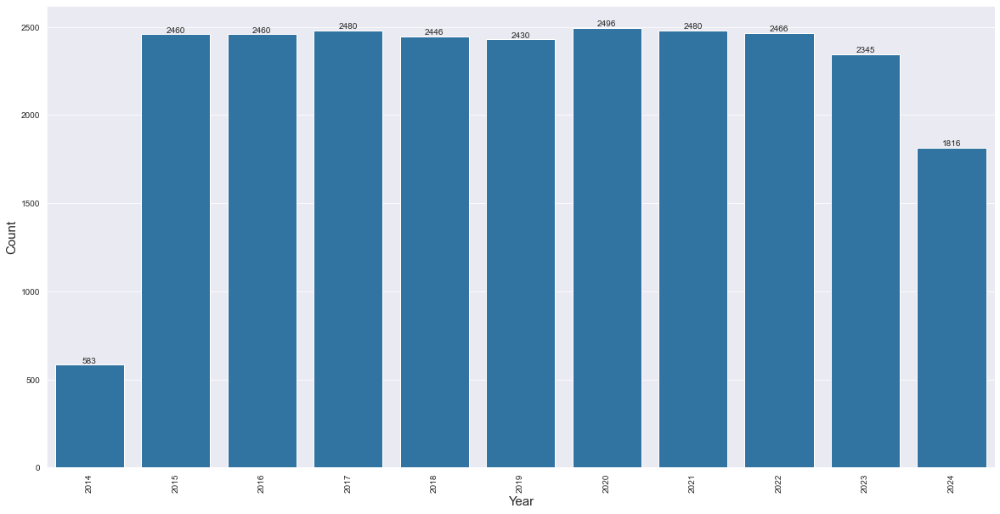

In [33]:
plt.figure(figsize = (20, 10))
sns.set_style('darkgrid')
ax=sns.countplot(data=stock_data, x=Year1)
for cont in ax.containers:
    ax.bar_label(cont)
plt.ylabel("Count", fontsize= 15)
plt.xlabel("Year", fontsize= 15)
plt.xticks(rotation=90)
plt.show()

In [34]:
# Identify the labels (index) of rows where the year is 2014
labels_to_drop = stock_data[stock_data['Date'].dt.year == 2014].index

# Drop the rows corresponding to 2014 using the labels
stock_data = stock_data.drop(labels=labels_to_drop, axis=0)

In [35]:
# Plotting count plot by year
Year1 = stock_data['Date'].dt.year

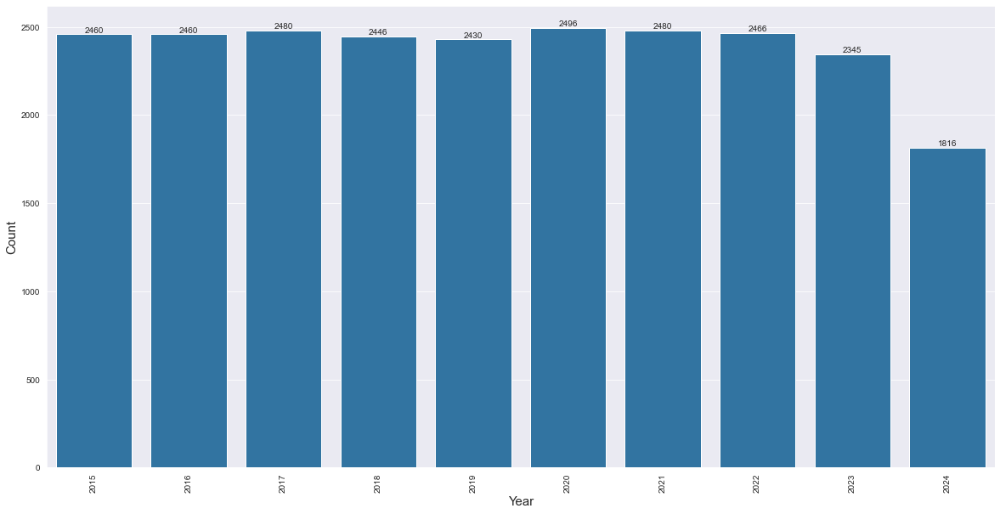

In [36]:
plt.figure(figsize = (20, 10))
sns.set_style('darkgrid')
ax=sns.countplot(data=stock_data, x=Year1)
for cont in ax.containers:
    ax.bar_label(cont)
plt.ylabel("Count", fontsize= 15)
plt.xlabel("Year", fontsize= 15)
plt.xticks(rotation=90)
plt.show()

In [37]:
for i in stock_data.columns.drop(['Ticker','Date']):
    print("The min value of ",i," is ",stock_data[i].min())

The min value of  Open  is  15
The min value of  High  is  15
The min value of  Low  is  16
The min value of  Close  is  15
The min value of  Adj Close  is  16
The min value of  Volume  is  964


In [38]:
column=stock_data['Ticker']
column
# Check for problematic values in the 'Close' column
print(stock_data['Close'].value_counts())

30       117
27        91
29        86
28        80
36        65
        ... 
2361       1
5398       1
2027       1
2345       1
13275      1
Name: Close, Length: 5815, dtype: Int64


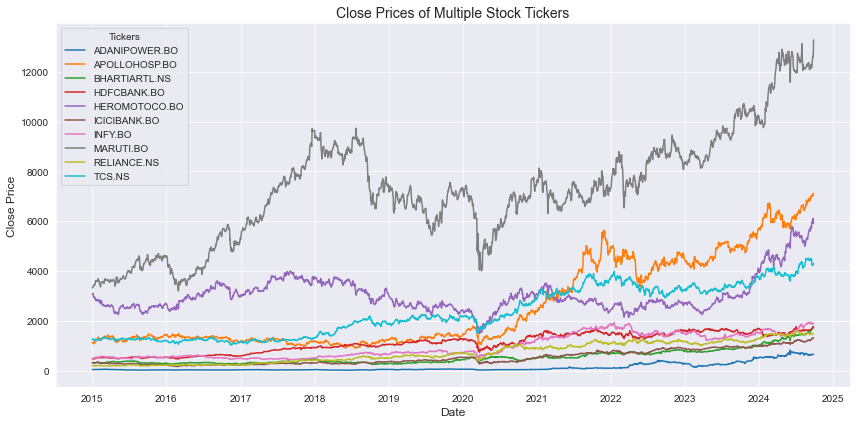

In [39]:
# Pivot data for plotting
pivot_df = stock_data.pivot(index='Date', columns='Ticker', values='Close')
# Convert the Int datatype to Float datatype
pivot_df = pivot_df.astype(float)
# Fill NaN values in pivot_df with an appropriate method
pivot_df = pivot_df.ffill()  # Forward fill
# OR
pivot_df = pivot_df.fillna(0)  # Replace NaN with 0 (if valid)
# Plotting
plt.figure(figsize=(12, 6))
for ticker in pivot_df.columns:
    plt.plot(pivot_df.index, pivot_df[ticker], label=ticker)

plt.title('Close Prices of Multiple Stock Tickers', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Close Price', fontsize=12)
plt.legend(title='Tickers', fontsize=10)
plt.grid(True)
plt.tight_layout()
plt.show()

In [40]:
import numpy as np
# Replace close prices in the range 0-100 with NaN
col=stock_data.columns.drop(['Ticker','Date'])
for val in col:
    stock_data.loc[(stock_data[val] > 0) & (stock_data[val] <= 100), val] = np.nan

In [41]:
columns_no_varience = []
for col in stock_data.columns:
    if len(stock_data[col].unique()) ==1:
        columns_no_varience.append(col)
        stock_data.drop([col], axis = 1, inplace = True)
print(columns_no_varience)
print (stock_data.shape)

[]
(23879, 8)


In [42]:
duplicate_rows = stock_data.duplicated()
print(duplicate_rows.any())
stock_data.drop_duplicates(inplace = True)
print(stock_data.shape)

False
(23879, 8)


In [43]:
## Checking For Duplicated Rows in Data
stock_data.duplicated().sum()

0

In [44]:
stock_data_numerical_columns = ['Open', 'High', 'Close', 'Low', 'Adj Close']
for column in stock_data_numerical_columns:
    print('Skewness of', column, 'before outlier treatment: ', stock_data[column].skew())

Skewness of Open before outlier treatment:  2.130789919753208
Skewness of High before outlier treatment:  1.9993607242455373
Skewness of Close before outlier treatment:  2.001427845713017
Skewness of Low before outlier treatment:  1.995548729229545
Skewness of Adj Close before outlier treatment:  1.9989379582533018


In [45]:
stock_data_numerical_columns = ['Open', 'High', 'Close', 'Low', 'Adj Close']
for column in stock_data_numerical_columns:
    print('Maximum value in', column, 'before outlier treatment: ', stock_data[column].max())

Maximum value in Open before outlier treatment:  13497
Maximum value in High before outlier treatment:  13497
Maximum value in Close before outlier treatment:  13275
Maximum value in Low before outlier treatment:  13675
Maximum value in Adj Close before outlier treatment:  13410


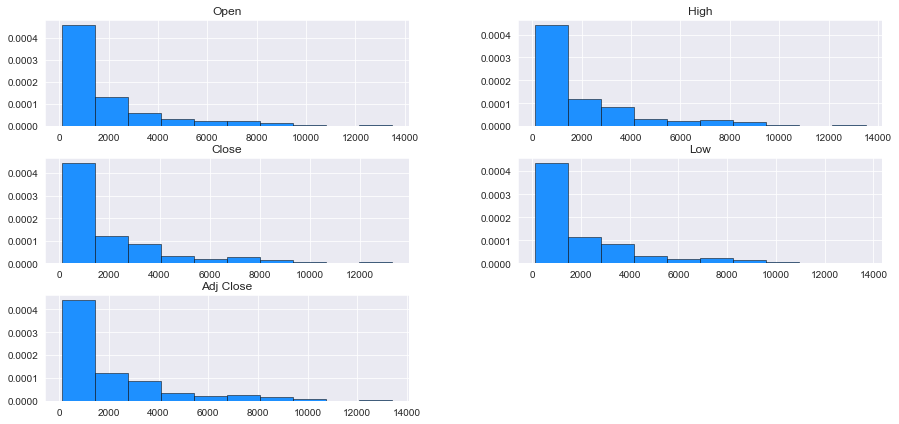

In [46]:
stock_data[['Open', 'High', 'Close', 'Low', 'Adj Close']].hist (figsize = (15,7),
       color = 'dodgerblue', density = True, edgecolor = 'black', linewidth = 0.5 )
plt.show()

In [47]:
stock_data.isnull().sum()

Date            0
Ticker          0
Open         1634
High         1634
Low          1607
Close        1657
Adj Close    1628
Volume          0
dtype: int64

In [48]:
print('Percentage of Missing values:')
print('-----------------------------')
stock_data.isnull().sum()/len(stock_data)*100

Percentage of Missing values:
-----------------------------


Date         0.000000
Ticker       0.000000
Open         6.842833
High         6.842833
Low          6.729763
Close        6.939152
Adj Close    6.817706
Volume       0.000000
dtype: float64

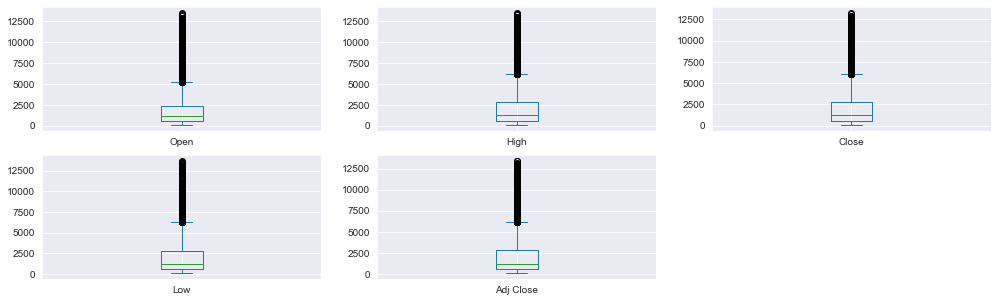

In [49]:
stock_data[['Open', 'High', 'Close', 'Low', 'Adj Close']].plot(kind = 'box',
                                                                        subplots = True, layout = (2,3), figsize = (17,5))
plt.show()

In [50]:
stock_data_numerical_columns = ['Open', 'High', 'Close', 'Low', 'Adj Close']
for column in stock_data_numerical_columns:
    Q1 = stock_data[column].quantile(0.25)
    Q3 = stock_data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    # Drop NaN values before comparison
    column_data = stock_data[column].dropna()
    outliers = [x for x in column_data if x < lower or x > upper]

    print(column)
    print('Identified outliers: %d' % len(outliers))
    print('*' * 40)

Open
Identified outliers: 2153
****************************************
High
Identified outliers: 1821
****************************************
Close
Identified outliers: 1819
****************************************
Low
Identified outliers: 1811
****************************************
Adj Close
Identified outliers: 1814
****************************************


In [51]:
stock_data['Open'].isna().sum()

1634

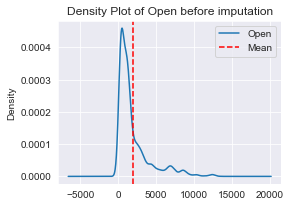

In [52]:
stock_data['Open'].plot(kind='density', figsize = (4, 3))
plt.title('Density Plot of Open before imputation')
plt.axvline(x=stock_data['Open'].mean(), color='red', linestyle='--', label='Mean')
plt.legend()
plt.show()

In [53]:
Skewness_of_Open_with_missing_values = stock_data['Open'].skew()

In [54]:
stock_data['Open']=stock_data.groupby(['Date'], group_keys=False)['Open'].apply(lambda x:x.fillna(x.median()))
stock_data['Open'].isna().sum()

0

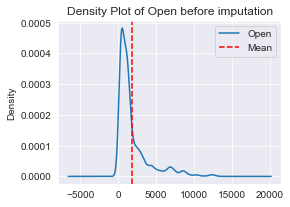

In [55]:
stock_data['Open'].plot(kind='density', figsize = (4, 3))
plt.title('Density Plot of Open before imputation')
plt.axvline(x=stock_data['Open'].mean(), color='red', linestyle='--', label='Mean')
plt.legend()
plt.show()

In [56]:
stock_data['Close'].isna().sum()

1657

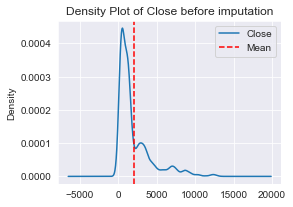

In [57]:
stock_data['Close'].plot(kind='density', figsize = (4, 3))
plt.title('Density Plot of Close before imputation')
plt.axvline(x=stock_data['Close'].mean(), color='red', linestyle='--', label='Mean')
plt.legend()
plt.show()

In [58]:
stock_data['Close']=stock_data.groupby(['Date'], group_keys=False)['Close'].apply(lambda x:x.fillna(x.median()))
stock_data['Close'].isna().sum()

0

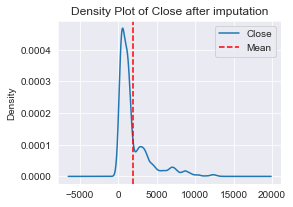

In [59]:
stock_data['Close'].plot(kind='density', figsize = (4, 3))
plt.title('Density Plot of Close after imputation')
plt.axvline(x=stock_data['Close'].mean(), color='red', linestyle='--', label='Mean')
plt.legend()
plt.show()

In [60]:
stock_data['Low'].isna().sum()

1607

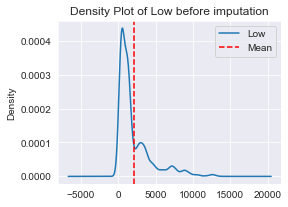

In [61]:
stock_data['Low'].plot(kind='density', figsize = (4, 3))
plt.title('Density Plot of Low before imputation')
plt.axvline(x=stock_data['Low'].mean(), color='red', linestyle='--', label='Mean')
plt.legend()
plt.show()

In [62]:
stock_data['Low']=stock_data.groupby(['Date'], group_keys=False)['Low'].apply(lambda x:x.fillna(x.median()))
stock_data['Low'].isna().sum()

0

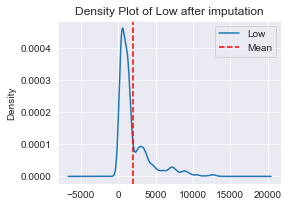

In [63]:
stock_data['Low'].plot(kind='density', figsize = (4, 3))
plt.title('Density Plot of Low after imputation')
plt.axvline(x=stock_data['Low'].mean(), color='red', linestyle='--', label='Mean')
plt.legend()
plt.show()

In [64]:
stock_data['High'].isna().sum()

1634

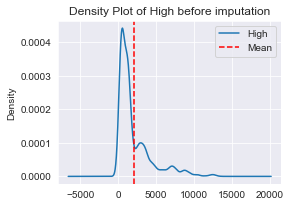

In [65]:
stock_data['High'].plot(kind='density', figsize = (4, 3))
plt.title('Density Plot of High before imputation')
plt.axvline(x=stock_data['High'].mean(), color='red', linestyle='--', label='Mean')
plt.legend()
plt.show()

In [66]:
stock_data['High']=stock_data.groupby(['Date'], group_keys=False)['High'].apply(lambda x:x.fillna(x.median()))
stock_data['High'].isna().sum()

0

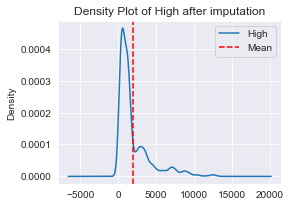

In [67]:
stock_data['High'].plot(kind='density', figsize = (4, 3))
plt.title('Density Plot of High after imputation')
plt.axvline(x=stock_data['High'].mean(), color='red', linestyle='--', label='Mean')
plt.legend()
plt.show()

In [68]:
stock_data['Adj Close'].isna().sum()

1628

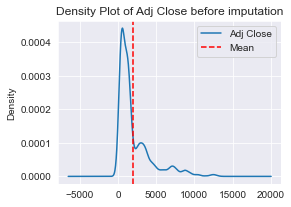

In [69]:
stock_data['Adj Close'].plot(kind='density', figsize = (4, 3))
plt.title('Density Plot of Adj Close before imputation')
plt.axvline(x=stock_data['High'].mean(), color='red', linestyle='--', label='Mean')
plt.legend()
plt.show()

In [70]:
stock_data['Adj Close']=stock_data.groupby(['Date'], group_keys=False)['Adj Close'].apply(lambda x:x.fillna(x.median()))
stock_data['Adj Close'].isna().sum()

0

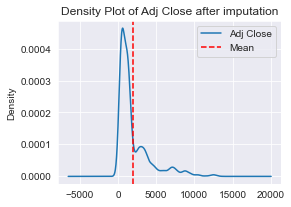

In [71]:
stock_data['Adj Close'].plot(kind='density', figsize = (4, 3))
plt.title('Density Plot of Adj Close after imputation')
plt.axvline(x=stock_data['Adj Close'].mean(), color='red', linestyle='--', label='Mean')
plt.legend()
plt.show()

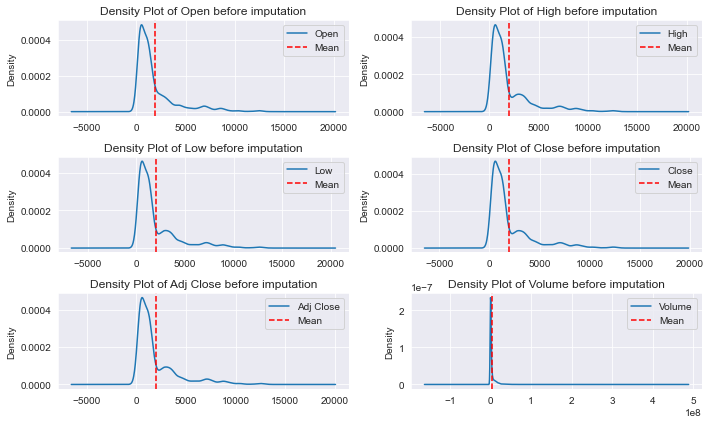

In [72]:
# Exclude unwanted columns
col = stock_data.columns.drop(['Ticker', 'Date'])

# Number of plots per row
plots_per_row = 2

# Initialize subplots
fig, axes = plt.subplots(nrows=(len(col) + 1) // plots_per_row, ncols=plots_per_row, figsize=(10, 6))
axes = axes.flatten()  # Flatten axes array for easy iteration

for idx, i in enumerate(col):
    stock_data[i].plot(kind='density', ax=axes[idx], figsize=(10, 6))
    axes[idx].set_title(f'Density Plot of {i} before imputation')
    axes[idx].axvline(x=stock_data[i].mean(), color='red', linestyle='--', label='Mean')
    axes[idx].legend()

# Hide unused axes (if any)
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()  # Adjust spacing between subplots
plt.show()


In [73]:
# Pivot data for plotting
pivot_df1 = stock_data.pivot(index='Date', columns='Ticker', values='Close')
pivot_df1.dtypes

Ticker
ADANIPOWER.BO    Int64
APOLLOHOSP.BO    Int64
BHARTIARTL.NS    Int64
HDFCBANK.BO      Int64
HEROMOTOCO.BO    Int64
ICICIBANK.BO     Int64
INFY.BO          Int64
MARUTI.BO        Int64
RELIANCE.NS      Int64
TCS.NS           Int64
dtype: object

In [74]:
pivot_df1 = pivot_df1.astype(float)
pivot_df1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2404 entries, 2015-01-01 to 2024-09-27
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ADANIPOWER.BO  2380 non-null   float64
 1   APOLLOHOSP.BO  2380 non-null   float64
 2   BHARTIARTL.NS  2404 non-null   float64
 3   HDFCBANK.BO    2383 non-null   float64
 4   HEROMOTOCO.BO  2380 non-null   float64
 5   ICICIBANK.BO   2380 non-null   float64
 6   INFY.BO        2383 non-null   float64
 7   MARUTI.BO      2381 non-null   float64
 8   RELIANCE.NS    2404 non-null   float64
 9   TCS.NS         2404 non-null   float64
dtypes: float64(10)
memory usage: 206.6 KB


In [75]:
pivot_df1.isnull().sum()

Ticker
ADANIPOWER.BO    24
APOLLOHOSP.BO    24
BHARTIARTL.NS     0
HDFCBANK.BO      21
HEROMOTOCO.BO    24
ICICIBANK.BO     24
INFY.BO          21
MARUTI.BO        23
RELIANCE.NS       0
TCS.NS            0
dtype: int64

In [76]:
# Fill NaN values in pivot_df1 (choose one approach based on the scenario)
pivot_df1 = pivot_df1.ffill()  # Forward fill missing values
# OR
#pivot_df1 = pivot_df1.fillna(0)  # Replace NaN with 0 if appropriate

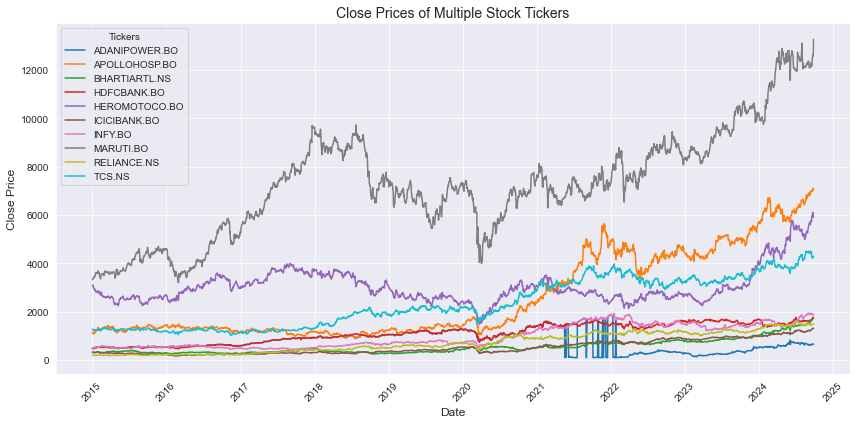

In [77]:
# Plotting
plt.figure(figsize=(12, 6))

for ticker in pivot_df1.columns:
    plt.plot(pivot_df1.index, pivot_df1[ticker], label=ticker)

plt.title('Close Prices of Multiple Stock Tickers', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Close Price', fontsize=12)
plt.legend(title='Tickers', fontsize=10, loc='upper left')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to fit labels and title
plt.show()

In [78]:
stock_data.loc[(stock_data['Ticker'] == 'ADANIPOWER.BO') , 'Ticker'] = np.nan


In [79]:
missing_values = pd.DataFrame(stock_data.isnull().sum(), columns=['Missing Values'])
missing_values

,Missing Values
Date,0
Ticker,2380
Open,0
High,0
Low,0
Close,0
Adj Close,0
Volume,0


In [80]:
stock_data = stock_data.dropna(subset=['Ticker'])

In [81]:
missing_values = pd.DataFrame(stock_data.isnull().sum(), columns=['Missing Values'])
missing_values

,Missing Values
Date,0
Ticker,0
Open,0
High,0
Low,0
Close,0
Adj Close,0
Volume,0


In [82]:
stock_data['Ticker'].value_counts()

BHARTIARTL.NS    2404
RELIANCE.NS      2404
TCS.NS           2404
HDFCBANK.BO      2383
INFY.BO          2383
MARUTI.BO        2381
APOLLOHOSP.BO    2380
HEROMOTOCO.BO    2380
ICICIBANK.BO     2380
Name: Ticker, dtype: int64

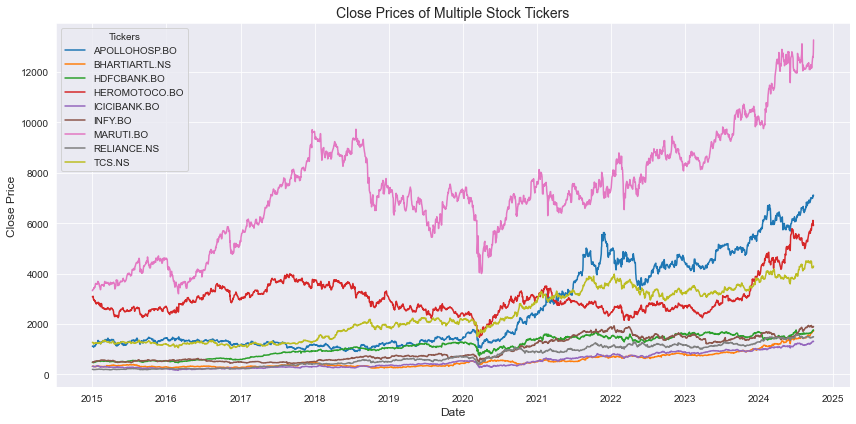

In [83]:
# Pivot data for plotting
pivot_df2 = stock_data.pivot(index='Date', columns='Ticker', values='Close')
# Ensure pivot_df has no NaN values
pivot_df2 = pivot_df2.fillna(method='ffill')  # Forward fill
# OR
# pivot_df = pivot_df.fillna(0)  # Replace NaN with 0

# Ensure data type is float
pivot_df2 = pivot_df2.astype(float)

# Plotting
plt.figure(figsize=(12, 6))
for ticker in pivot_df2.columns:
    plt.plot(pivot_df2.index, pivot_df2[ticker], label=ticker)

plt.title('Close Prices of Multiple Stock Tickers', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Close Price', fontsize=12)
plt.legend(title='Tickers', fontsize=10)
plt.grid(True)
plt.tight_layout()
plt.show()

In [84]:
# Numerical columns to check for outliers
stock_data_numerical_columns = stock_data.columns.drop(['Ticker', 'Date'])

# Remove outliers using the IQR method
for column in stock_data_numerical_columns:
    Q1 = stock_data[column].quantile(0.25)  # First quartile
    Q3 = stock_data[column].quantile(0.75)  # Third quartile
    IQR = Q3 - Q1                           # Interquartile Range

    # Define the lower and upper bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filter out outliers
    stock_data = stock_data[(stock_data[column] >= lower_bound) & (stock_data[column] <= upper_bound)]

# Display the updated dataset
print("Outliers removed. Dataset shape:", stock_data.shape)


Outliers removed. Dataset shape: (13937, 8)


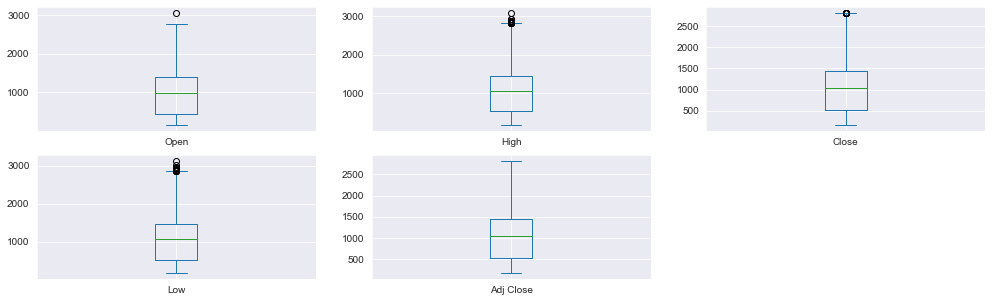

In [85]:
stock_data[['Open', 'High', 'Close', 'Low', 'Adj Close']].plot(kind = 'box',
                                                                        subplots = True, layout = (2,3), figsize = (17,5))
plt.show()

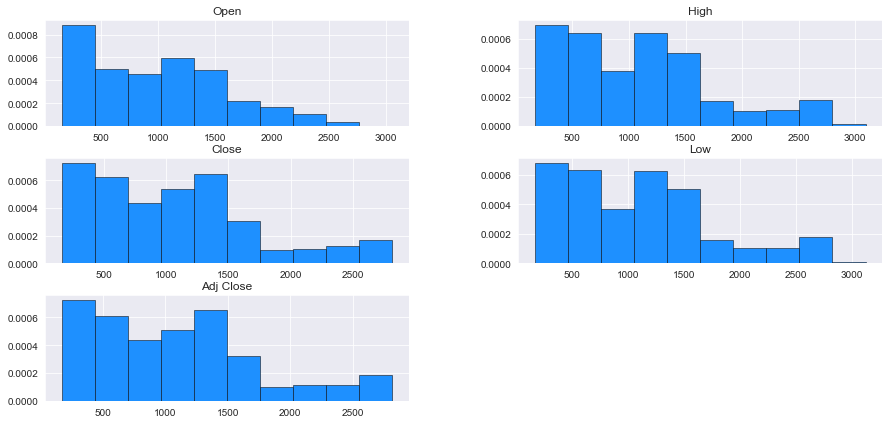

In [86]:
stock_data[['Open', 'High', 'Close', 'Low', 'Adj Close']].hist (figsize = (15,7),
       color = 'dodgerblue', density = True, edgecolor = 'black', linewidth = 0.5 )
plt.show()

<AxesSubplot:>

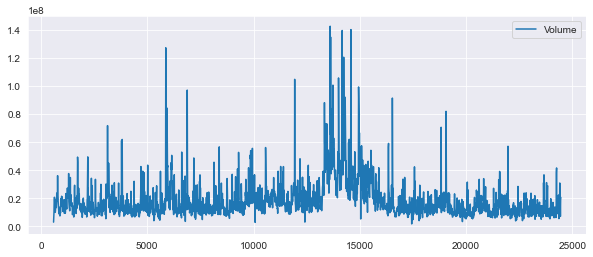

In [87]:
# Now let's plot the total volume of stock being traded each day over the past year

stock_data3['Volume'].plot(legend=True, figsize=(10,4))

In [88]:
# Assessing the 0 values of the "Volume" column
len(stock_data3[stock_data3["Volume"]==0])

0

In [89]:
# Check if the condition is true for all rows
is_valid = ((stock_data['Low'] <= stock_data['Open']) & 
            (stock_data['Open'] <= stock_data['High']) & 
            (stock_data['High'] <= stock_data['Close']))

# Verify if all rows satisfy the condition
if is_valid.all():
    print("All rows satisfy the condition: Low ≤ Open ≤ High ≤ Close.")
else:
    print("There are rows that do not satisfy the condition.")
    # Optional: Display the rows that fail the condition
    invalid_rows = stock_data[~is_valid]
    print("Invalid rows:")
    print(invalid_rows)


There are rows that do not satisfy the condition.
Invalid rows:
            Date         Ticker  Open  High   Low  Close  Adj Close   Volume
584   2015-01-01  APOLLOHOSP.BO  1086  1126  1135   1120       1135     3679
585   2015-01-01  BHARTIARTL.NS   311   327   329    317        319  2460188
586   2015-01-01    HDFCBANK.BO   424   476   477    473        476   106832
588   2015-01-01   ICICIBANK.BO   295   321   323    318        323   274695
589   2015-01-01        INFY.BO   339   494   495    489        492   152124
...          ...            ...   ...   ...   ...    ...        ...      ...
24448 2024-09-26        INFY.BO  1878  1899  1917   1890       1890   129294
24454 2024-09-27  BHARTIARTL.NS  1735  1735  1763   1722       1755  7116861
24455 2024-09-27    HDFCBANK.BO  1753  1753  1778   1750       1778   232369
24457 2024-09-27   ICICIBANK.BO  1306  1306  1332   1303       1331   218203
24458 2024-09-27        INFY.BO  1886  1907  1975   1903       1930   262993

[13937 rows

In [90]:
# Identify invalid rows where the condition is not satisfied
invalid_rows = stock_data[(stock_data['Low'] > stock_data['Open']) | 
                          (stock_data['Open'] > stock_data['High']) | 
                          (stock_data['High'] > stock_data['Close'])]

print("Invalid rows before correction:")
print(invalid_rows)

# Correct invalid rows
for idx in invalid_rows.index:
    row = stock_data.loc[idx]
    # Enforce the logical condition: Low ≤ Open ≤ High ≤ Close
    low, open_, high, close = row['Low'], row['Open'], row['High'], row['Close']
    corrected_low = min(low, open_, high, close)
    corrected_high = max(low, open_, high, close)
    corrected_open = min(max(low, open_), corrected_high)
    corrected_close = min(max(corrected_open, close), corrected_high)

    # Update the row
    stock_data.at[idx, 'Low'] = corrected_low
    stock_data.at[idx, 'Open'] = corrected_open
    stock_data.at[idx, 'High'] = corrected_high
    stock_data.at[idx, 'Close'] = corrected_close

# Validate that all rows now satisfy the condition
is_valid = ((stock_data['Low'] <= stock_data['Open']) & 
            (stock_data['Open'] <= stock_data['High']) & 
            (stock_data['High'] <= stock_data['Close']))

if is_valid.all():
    print("All rows now satisfy the condition.")
else:
    print("There are still invalid rows.")
    print(stock_data[~is_valid])


Invalid rows before correction:
            Date         Ticker  Open  High   Low  Close  Adj Close   Volume
584   2015-01-01  APOLLOHOSP.BO  1086  1126  1135   1120       1135     3679
585   2015-01-01  BHARTIARTL.NS   311   327   329    317        319  2460188
586   2015-01-01    HDFCBANK.BO   424   476   477    473        476   106832
588   2015-01-01   ICICIBANK.BO   295   321   323    318        323   274695
589   2015-01-01        INFY.BO   339   494   495    489        492   152124
...          ...            ...   ...   ...   ...    ...        ...      ...
24448 2024-09-26        INFY.BO  1878  1899  1917   1890       1890   129294
24454 2024-09-27  BHARTIARTL.NS  1735  1735  1763   1722       1755  7116861
24455 2024-09-27    HDFCBANK.BO  1753  1753  1778   1750       1778   232369
24457 2024-09-27   ICICIBANK.BO  1306  1306  1332   1303       1331   218203
24458 2024-09-27        INFY.BO  1886  1907  1975   1903       1930   262993

[13937 rows x 8 columns]
All rows now satis

In [91]:
# Check if the condition is true for all rows
is_valid = ((stock_data['Low'] <= stock_data['Open']) & 
            (stock_data['Open'] <= stock_data['High']) & 
            (stock_data['High'] <= stock_data['Close']))

# Verify if all rows satisfy the condition
if is_valid.all():
    print("All rows satisfy the condition: Low ≤ Open ≤ High ≤ Close.")
else:
    print("There are rows that do not satisfy the condition.")
    # Optional: Display the rows that fail the condition
    invalid_rows = stock_data[~is_valid]
    print("Invalid rows:")
    print(invalid_rows)

All rows satisfy the condition: Low ≤ Open ≤ High ≤ Close.


In [92]:
stock_data.describe()

,Open,High,Low,Close,Adj Close,Volume
count,13937.0,13937.0,13937.0,13937.0,13937.0,13937.0
mean,1096.806056,1096.806056,994.230968,1096.806056,1084.85578,1942087.641888
std,672.302359,672.302359,587.432052,672.302359,664.15763,2890327.959268
min,169.0,169.0,156.0,169.0,168.0,964.0
25%,527.0,527.0,436.0,527.0,522.0,133032.0
50%,1057.0,1057.0,982.0,1057.0,1045.0,490627.0
75%,1461.0,1461.0,1392.0,1461.0,1446.0,2529698.0
max,3125.0,3125.0,2761.0,3125.0,2818.0,12161869.0


In [93]:
stock_data.corr()   

,Open,High,Low,Close,Adj Close,Volume
Open,1.000000,1.000000,0.987111,1.000000,0.999722,-0.258238
High,1.000000,1.000000,0.987111,1.000000,0.999722,-0.258238
Low,0.987111,0.987111,1.000000,0.987111,0.986955,-0.245302
Close,1.000000,1.000000,0.987111,1.000000,0.999722,-0.258238
Adj Close,0.999722,0.999722,0.986955,0.999722,1.000000,-0.258499
Volume,-0.258238,-0.258238,-0.245302,-0.258238,-0.258499,1.000000


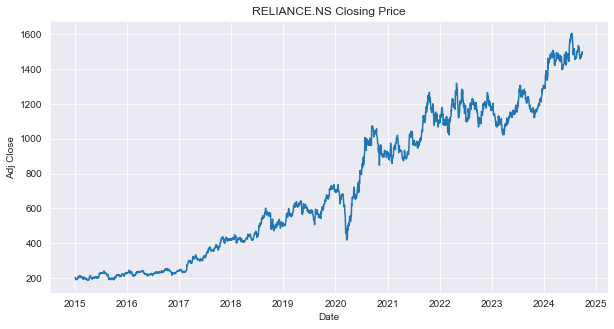

In [94]:
# plot lineplot
stock = 'RELIANCE.NS'
plt.figure(figsize = (10,5))
sns.lineplot(data = stock_data3,x='Date',y='Adj Close')
plt.title(f'{stock} Closing Price')
plt.show()

<AxesSubplot:>

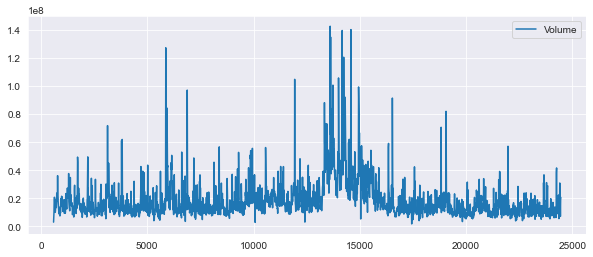

In [95]:
stock_data3['Volume'].plot(legend=True,figsize=(10,4))

In [96]:
Tech_list=stock_data["Ticker"].unique()
Tech_list

array(['APOLLOHOSP.BO', 'BHARTIARTL.NS', 'HDFCBANK.BO', 'ICICIBANK.BO',
       'INFY.BO', 'RELIANCE.NS', 'TCS.NS', 'HEROMOTOCO.BO'], dtype=object)

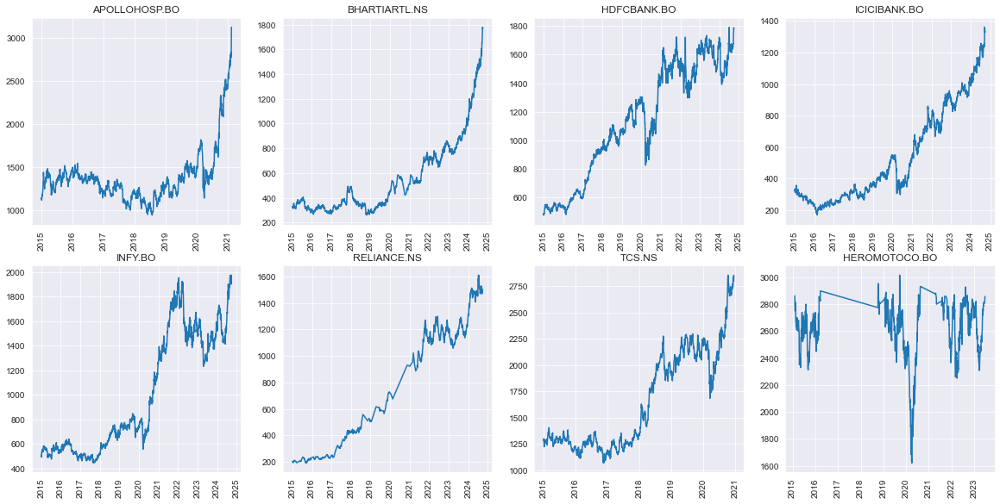

In [97]:
plt.figure(figsize=(20,15))
for i, company in enumerate(Tech_list,1):
    plt.subplot(3,4,i)
    plt.title(company)
    df=stock_data[stock_data["Ticker"]== company]
    plt.plot(df["Date"], df["Close"])
    plt.xticks(rotation="vertical")

In [98]:
import plotly.express as px
for comapny in Tech_list:
    df= stock_data[stock_data["Ticker"]== company]
    plot=px.line(df,x="Date",y= "Volume",title=comapny)
    plot.show()

In [99]:
stock_data3.head()

,Date,Ticker,Open,High,Low,Close,Adj Close,Volume
591,2015-01-01,RELIANCE.NS,188,203,204,202,203,2963643
601,2015-01-02,RELIANCE.NS,188,202,205,202,203,7331366
611,2015-01-05,RELIANCE.NS,186,200,204,200,202,10103941
621,2015-01-06,RELIANCE.NS,177,191,200,190,199,18627980
631,2015-01-07,RELIANCE.NS,181,195,196,191,191,20720312


In [100]:
col=['Open','Close','Low','High','Adj Close']
stock_data3[col] = stock_data3[col].astype(float)

In [101]:
stock_data3["Daily price change"]= stock_data3["Close"]-stock_data3["Open"]

In [102]:
stock_data3.head()

,Date,Ticker,Open,High,Low,Close,Adj Close,Volume,Daily price change
591,2015-01-01,RELIANCE.NS,188.0,203.0,204.0,202.0,203.0,2963643,14.0
601,2015-01-02,RELIANCE.NS,188.0,202.0,205.0,202.0,203.0,7331366,14.0
611,2015-01-05,RELIANCE.NS,186.0,200.0,204.0,200.0,202.0,10103941,14.0
621,2015-01-06,RELIANCE.NS,177.0,191.0,200.0,190.0,199.0,18627980,13.0
631,2015-01-07,RELIANCE.NS,181.0,195.0,196.0,191.0,191.0,20720312,10.0


In [103]:
stock_data3["% daily price change"]= ((stock_data3["Daily price change"])/stock_data3["Close"])*100

In [104]:
stock_data3.head()

,Date,Ticker,Open,High,Low,Close,Adj Close,Volume,Daily price change,% daily price change
591,2015-01-01,RELIANCE.NS,188.0,203.0,204.0,202.0,203.0,2963643,14.0,6.930693
601,2015-01-02,RELIANCE.NS,188.0,202.0,205.0,202.0,203.0,7331366,14.0,6.930693
611,2015-01-05,RELIANCE.NS,186.0,200.0,204.0,200.0,202.0,10103941,14.0,7.000000
621,2015-01-06,RELIANCE.NS,177.0,191.0,200.0,190.0,199.0,18627980,13.0,6.842105
631,2015-01-07,RELIANCE.NS,181.0,195.0,196.0,191.0,191.0,20720312,10.0,5.235602


In [105]:
plot=px.line(stock_data3, x="Date", y="% daily price change", title= "RELIANCE.NS")
plot.show()

In [106]:
import plotly.express as px
fig = px.line(stock_data3, x="Date", y="% daily price change", title='Daily price change in stock' ,template = 'plotly_dark')
fig.show()

In [107]:
stock_data3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2404 entries, 591 to 24460
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Date                  2404 non-null   datetime64[ns]
 1   Ticker                2404 non-null   object        
 2   Open                  2404 non-null   float64       
 3   High                  2404 non-null   float64       
 4   Low                   2404 non-null   float64       
 5   Close                 2404 non-null   float64       
 6   Adj Close             2404 non-null   float64       
 7   Volume                2404 non-null   Int64         
 8   Daily price change    2404 non-null   float64       
 9   % daily price change  2404 non-null   float64       
dtypes: Int64(1), datetime64[ns](1), float64(7), object(1)
memory usage: 208.9+ KB


<AxesSubplot:xlabel='Date'>

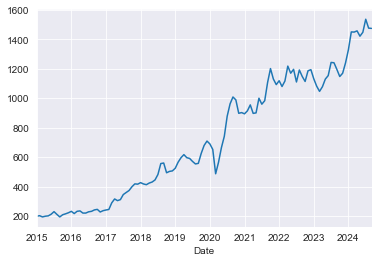

In [108]:
# Convert 'Date' column to datetime if it's not already in datetime format
stock_data3['Date'] = pd.to_datetime(stock_data3['Date'])

# Set 'Date' as the index
stock_data3.set_index('Date', inplace=True)

# Now you can resample by month and plot the mean of 'Close' prices
stock_data3['Close'].resample('M').mean().plot()


<AxesSubplot:xlabel='Date'>

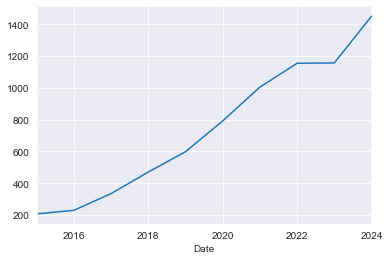

In [109]:
stock_data3['Close'].resample('Y').mean().plot()

In [110]:
# Pivot the dataset to get Close prices for each ticker
close_prices = s_data.pivot(columns='Ticker', values='Close')

# Reset the index to simple integers
close_prices.reset_index(drop=True, inplace=True)

# Assign index as 1, 2, 3...
close_prices.index = range(1, len(close_prices) + 1)

# Display the reorganized DataFrame
print(close_prices)

Ticker  ADANIPOWER.BO  APOLLOHOSP.BO  BHARTIARTL.NS  HDFCBANK.BO  \
1           43.200001            NaN            NaN          NaN   
2                 NaN        1089.75            NaN          NaN   
3                 NaN            NaN     361.404175          NaN   
4                 NaN            NaN            NaN        431.0   
5                 NaN            NaN            NaN          NaN   
...               ...            ...            ...          ...   
24458             NaN            NaN            NaN          NaN   
24459             NaN            NaN            NaN          NaN   
24460             NaN            NaN            NaN          NaN   
24461             NaN            NaN            NaN          NaN   
24462             NaN            NaN            NaN          NaN   

Ticker  HEROMOTOCO.BO  ICICIBANK.BO      INFY.BO     MARUTI.BO  RELIANCE.NS  \
1                 NaN           NaN          NaN           NaN          NaN   
2                 NaN    

In [111]:
close_prices.head()

Ticker,ADANIPOWER.BO,APOLLOHOSP.BO,BHARTIARTL.NS,HDFCBANK.BO,HEROMOTOCO.BO,ICICIBANK.BO,INFY.BO,MARUTI.BO,RELIANCE.NS,TCS.NS
1,43.200001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,1089.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,361.404175,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,431.0,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,2825.300049,NaN,NaN,NaN,NaN,NaN


In [112]:
# Fill missing values using forward fill
close_prices.fillna(method='ffill', inplace=True)

# Optionally, use backward fill
close_prices.fillna(method='bfill', inplace=True)

# Or fill with 0
close_prices.fillna(0, inplace=True)

In [113]:
close_prices.head()

Ticker,ADANIPOWER.BO,APOLLOHOSP.BO,BHARTIARTL.NS,HDFCBANK.BO,HEROMOTOCO.BO,ICICIBANK.BO,INFY.BO,MARUTI.BO,RELIANCE.NS,TCS.NS
1,43.200001,1089.75,361.404175,431.0,2825.300049,259.272736,463.0,3017.550049,211.450867,1354.074951
2,43.200001,1089.75,361.404175,431.0,2825.300049,259.272736,463.0,3017.550049,211.450867,1354.074951
3,43.200001,1089.75,361.404175,431.0,2825.300049,259.272736,463.0,3017.550049,211.450867,1354.074951
4,43.200001,1089.75,361.404175,431.0,2825.300049,259.272736,463.0,3017.550049,211.450867,1354.074951
5,43.200001,1089.75,361.404175,431.0,2825.300049,259.272736,463.0,3017.550049,211.450867,1354.074951


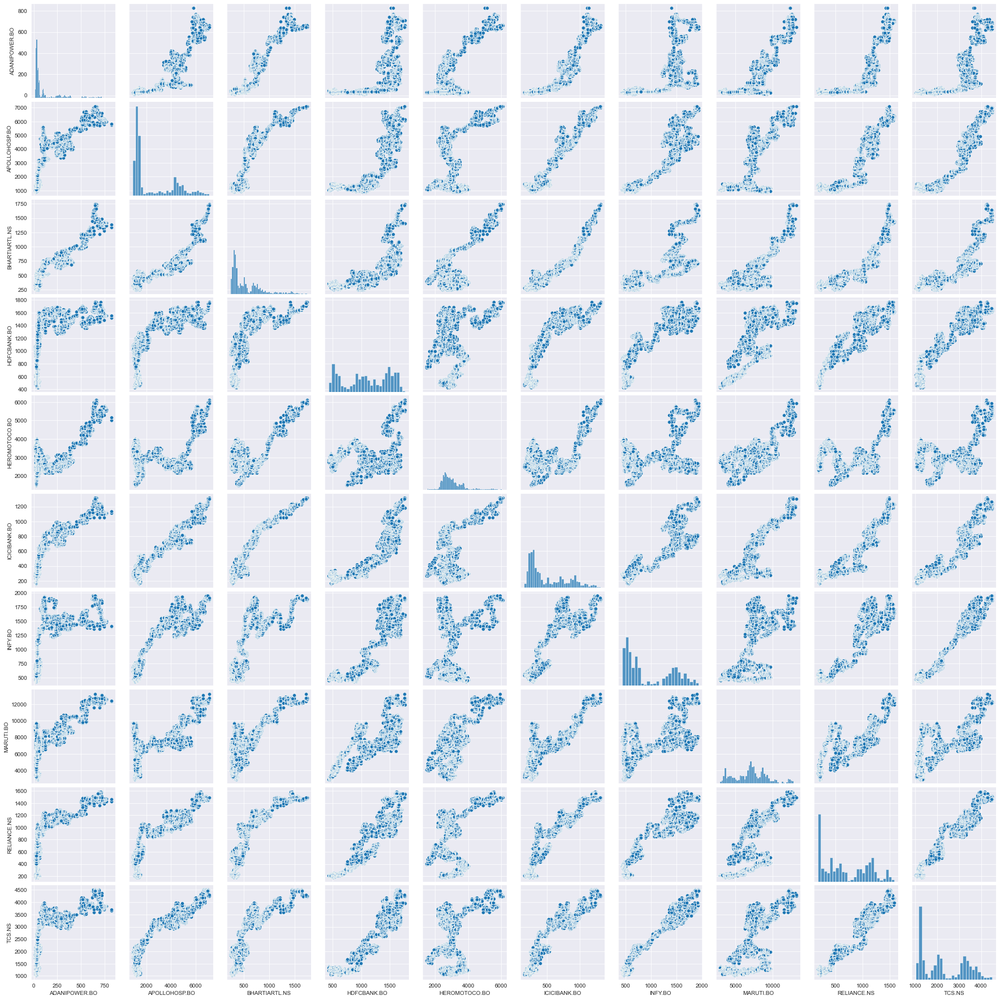

In [114]:
sns.pairplot(data=close_prices)

<AxesSubplot:xlabel='Ticker', ylabel='Ticker'>

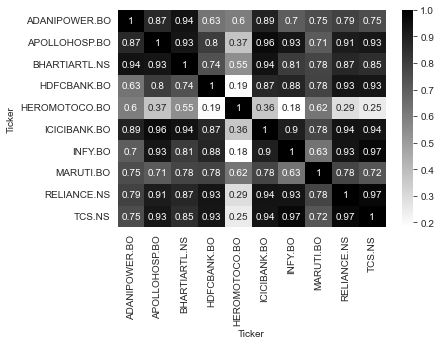

In [115]:
sns.heatmap(close_prices.corr(),annot=True,cmap='gray_r',linecolor="black")

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, '2015-12-31 00:00:00'),
  Text(1, 0, '2016-12-31 00:00:00'),
  Text(2, 0, '2017-12-31 00:00:00'),
  Text(3, 0, '2018-12-31 00:00:00'),
  Text(4, 0, '2019-12-31 00:00:00'),
  Text(5, 0, '2020-12-31 00:00:00'),
  Text(6, 0, '2021-12-31 00:00:00'),
  Text(7, 0, '2022-12-31 00:00:00'),
  Text(8, 0, '2023-12-31 00:00:00'),
  Text(9, 0, '2024-12-31 00:00:00')])

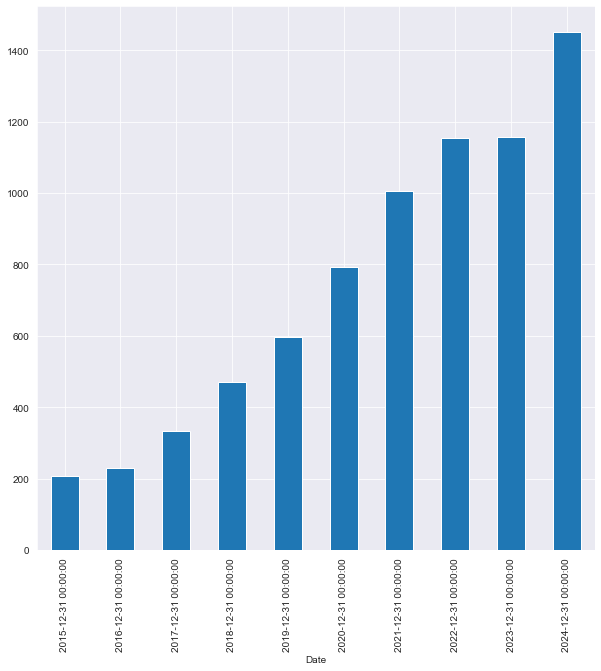

In [116]:
plt.figure(figsize=(10,10))
stock_data3['Close'].resample("Y").mean().plot(kind="bar")
plt.xticks(rotation="vertical")

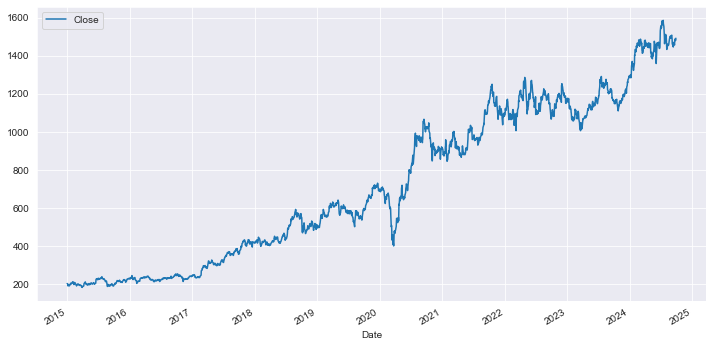

In [117]:
# Let's see a historical view of the closing price
stock_data3['Close'].plot(legend=True, figsize = (12, 6))
plt.show()

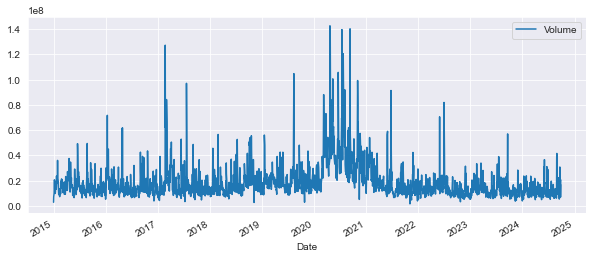

In [118]:
# Now let's plot the total volume of stock being traded each day over the past 5 years
stock_data3['Volume'].plot(legend=True,figsize=(10,4))
plt.show()

In [119]:
# Let's go ahead and plot out several moving averages
ma_day = [10,20,50]

for ma in ma_day:
    column_name = "MA for %s days" %(str(ma))
    stock_data3[column_name]=pd.DataFrame.rolling(stock_data3['Close'],ma).mean()

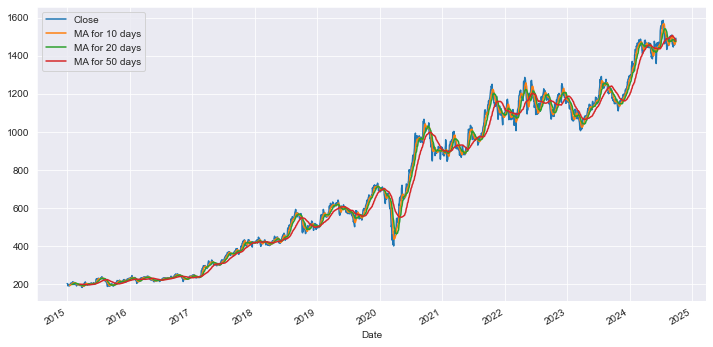

In [120]:
stock_data3[['Close','MA for 10 days','MA for 20 days','MA for 50 days']].plot(subplots=False,figsize=(12,6))
plt.show()

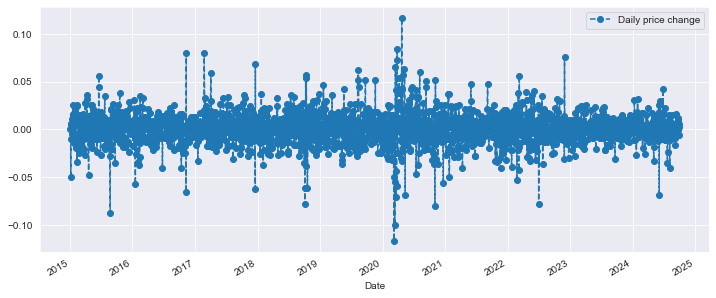

In [121]:
# use pct_change to find the percent change for each day
stock_data3['Daily price change'] =  stock_data3['Close'].pct_change()
# plot the daily return percentage
stock_data3['Daily price change'].plot(figsize=(12,5),legend=True,linestyle='--',marker='o')
plt.show()

In [122]:
s_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24462 entries, 0 to 24461
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       24462 non-null  datetime64[ns]
 1   Ticker     24462 non-null  object        
 2   Open       24462 non-null  float64       
 3   High       24462 non-null  float64       
 4   Low        24462 non-null  float64       
 5   Close      24462 non-null  float64       
 6   Adj Close  24462 non-null  float64       
 7   Volume     24462 non-null  float64       
dtypes: datetime64[ns](1), float64(6), object(1)
memory usage: 1.5+ MB


In [123]:
# Step 2: Recalculate the Daily Return
s_data['Daily_Return'] = ((s_data['Close'] - s_data['Open']) / s_data['Close']) * 100

In [124]:
# Pivot the dataset to organize by Ticker
daily_returns = s_data.pivot(index='Date', columns='Ticker', values='Daily_Return')

# Reset the index to integers if required
daily_returns.reset_index(drop=True, inplace=True)
daily_returns.index = range(1, len(daily_returns) + 1)
daily_returns.head() 

Ticker,ADANIPOWER.BO,APOLLOHOSP.BO,BHARTIARTL.NS,HDFCBANK.BO,HEROMOTOCO.BO,ICICIBANK.BO,INFY.BO,MARUTI.BO,RELIANCE.NS,TCS.NS
1,-0.462965,0.849502,4.024744,9.902416,26.340468,7.306321,30.587914,5.959246,5.224142,17.963545
2,-0.348436,2.571254,4.664877,10.212276,26.241704,7.296919,29.447897,7.065252,7.173514,17.671509
3,-0.358855,3.242585,4.212213,10.013210,26.547297,7.016203,30.297225,7.221833,7.022581,18.645192
4,-2.767753,2.619263,4.397673,9.888591,26.155593,6.507433,31.265500,6.699708,5.728657,17.776082
5,-2.674422,1.829415,3.627314,8.889268,26.414359,5.885949,31.102487,5.972107,5.668158,18.225668


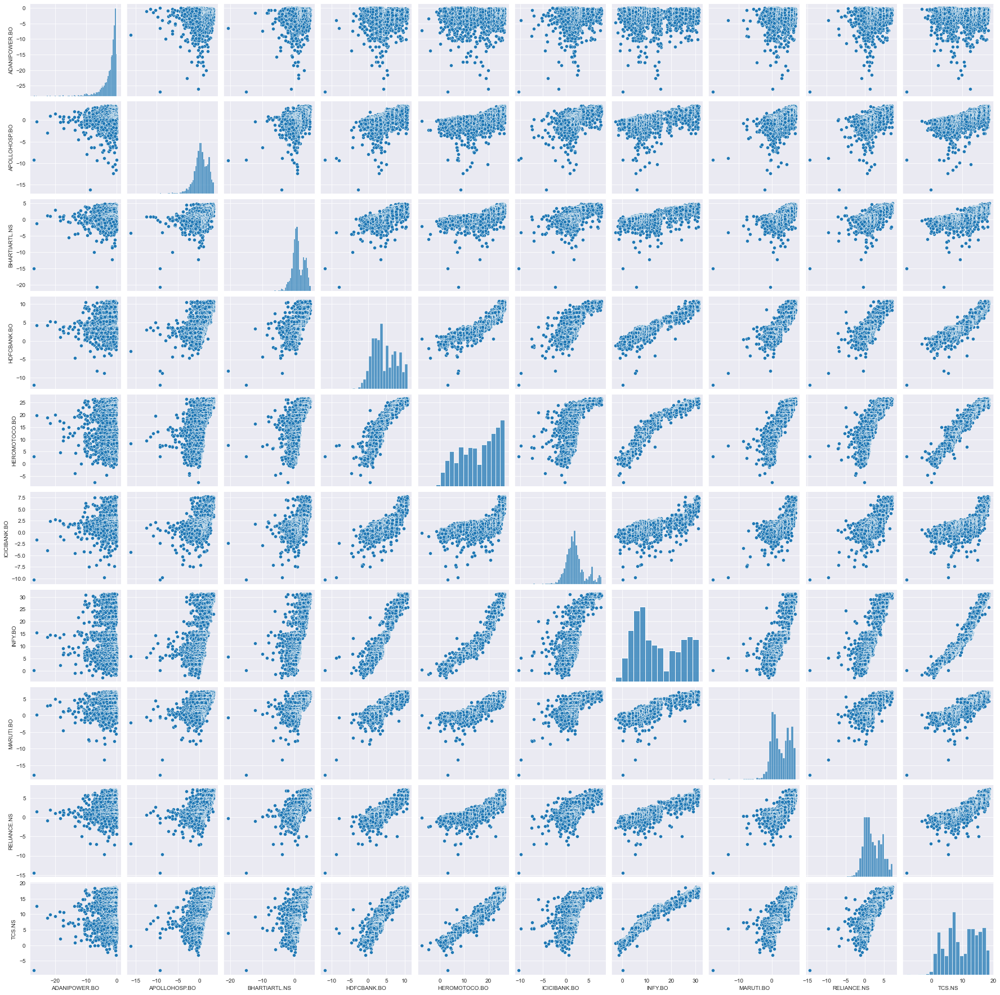

In [125]:
sns.pairplot(data=daily_returns)

<AxesSubplot:xlabel='Ticker', ylabel='Ticker'>

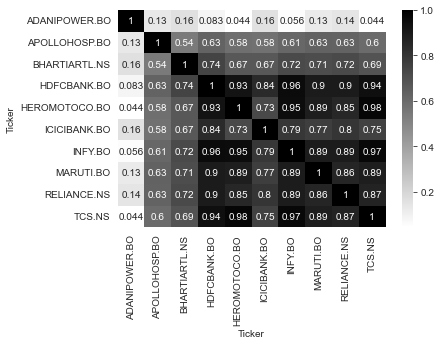

In [126]:
sns.heatmap(daily_returns.corr(),annot=True,cmap='gray_r',linecolor="black")

In [127]:
stock_data3.head()

,Ticker,Open,High,Low,Close,Adj Close,Volume,Daily price change,% daily price change,MA for 10 days,MA for 20 days,MA for 50 days
Date,,,,,,,,,,,,
2015-01-01,RELIANCE.NS,188.0,203.0,204.0,202.0,203.0,2963643,NaN,6.930693,NaN,NaN,NaN
2015-01-02,RELIANCE.NS,188.0,202.0,205.0,202.0,203.0,7331366,0.000000,6.930693,NaN,NaN,NaN
2015-01-05,RELIANCE.NS,186.0,200.0,204.0,200.0,202.0,10103941,-0.009901,7.000000,NaN,NaN,NaN
2015-01-06,RELIANCE.NS,177.0,191.0,200.0,190.0,199.0,18627980,-0.050000,6.842105,NaN,NaN,NaN
2015-01-07,RELIANCE.NS,181.0,195.0,196.0,191.0,191.0,20720312,0.005263,5.235602,NaN,NaN,NaN


In [128]:
stock_data3.isnull().sum()

Ticker                   0
Open                     0
High                     0
Low                      0
Close                    0
Adj Close                0
Volume                   0
Daily price change       1
% daily price change     0
MA for 10 days           9
MA for 20 days          19
MA for 50 days          49
dtype: int64

In [129]:
# Fill missing values using forward fill
stock_data3.fillna(method='ffill', inplace=True)
# Optionally, use backward fill
stock_data3.fillna(method='bfill', inplace=True)
# Or fill with 0
stock_data3.fillna(0, inplace=True)

In [130]:
stock_data3.head()

,Ticker,Open,High,Low,Close,Adj Close,Volume,Daily price change,% daily price change,MA for 10 days,MA for 20 days,MA for 50 days
Date,,,,,,,,,,,,
2015-01-01,RELIANCE.NS,188.0,203.0,204.0,202.0,203.0,2963643,0.000000,6.930693,194.4,197.2,199.0
2015-01-02,RELIANCE.NS,188.0,202.0,205.0,202.0,203.0,7331366,0.000000,6.930693,194.4,197.2,199.0
2015-01-05,RELIANCE.NS,186.0,200.0,204.0,200.0,202.0,10103941,-0.009901,7.000000,194.4,197.2,199.0
2015-01-06,RELIANCE.NS,177.0,191.0,200.0,190.0,199.0,18627980,-0.050000,6.842105,194.4,197.2,199.0
2015-01-07,RELIANCE.NS,181.0,195.0,196.0,191.0,191.0,20720312,0.005263,5.235602,194.4,197.2,199.0


In [131]:
stock_data.head()

,Date,Ticker,Open,High,Low,Close,Adj Close,Volume
584,2015-01-01,APOLLOHOSP.BO,1135,1135,1086,1135,1135,3679
585,2015-01-01,BHARTIARTL.NS,329,329,311,329,319,2460188
586,2015-01-01,HDFCBANK.BO,477,477,424,477,476,106832
588,2015-01-01,ICICIBANK.BO,323,323,295,323,323,274695
589,2015-01-01,INFY.BO,495,495,339,495,492,152124


In [132]:
from sklearn.preprocessing import MinMaxScaler
from keras.layers import LSTM, Dense, Dropout
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.dates as mdates  # Corrected "mandates" to "mdates"
from sklearn import linear_model
from keras.models import Sequential
from keras.layers import Dense, LSTM  # Combined duplicate import of Dense & LSTM
import keras.backend as K  # Corrected import syntax
from keras.callbacks import EarlyStopping  # Corrected "Callbacks" to "callbacks"
from keras.optimizers import Adam  # Corrected "Optimisers" to "optimizers"
from keras.models import load_model  # Corrected "Models" to "models"
from keras.utils import plot_model  # Corrected "utils. vis_utils" spacing

<AxesSubplot:xlabel='Date'>

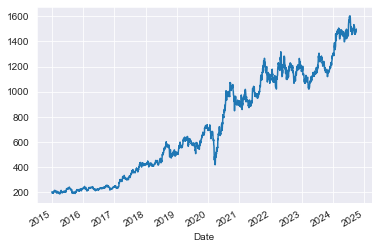

In [133]:
#Plot the True Adj Close Value
stock_data3['Adj Close'].plot()

In [134]:
stock_data3.columns

Index(['Ticker', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume',
       'Daily price change', '% daily price change', 'MA for 10 days',
       'MA for 20 days', 'MA for 50 days'],
      dtype='object')

In [135]:
stock_data3.drop(['Daily price change', '% daily price change', 'MA for 10 days',
       'MA for 20 days', 'MA for 50 days','Close'],axis=1)

,Ticker,Open,High,Low,Adj Close,Volume
Date,,,,,,
2015-01-01,RELIANCE.NS,188.0,203.0,204.0,203.0,2963643
2015-01-02,RELIANCE.NS,188.0,202.0,205.0,203.0,7331366
2015-01-05,RELIANCE.NS,186.0,200.0,204.0,202.0,10103941
2015-01-06,RELIANCE.NS,177.0,191.0,200.0,199.0,18627980
2015-01-07,RELIANCE.NS,181.0,195.0,196.0,191.0,20720312
...,...,...,...,...,...,...
2024-09-23,RELIANCE.NS,1493.0,1493.0,1502.0,1491.0,8832314
2024-09-24,RELIANCE.NS,1489.0,1489.0,1500.0,1488.0,17137444
2024-09-25,RELIANCE.NS,1494.0,1494.0,1496.0,1484.0,7069002


In [136]:
#Set Target Variable
output_var = pd.DataFrame(stock_data3['Adj Close'])
#Selecting the Features
features = ['Open', 'High', 'Low', 'Volume']

In [137]:
#Scaling
scaler = MinMaxScaler()
feature_transform = scaler.fit_transform(stock_data3[features])
feature_transform= pd.DataFrame(columns=features, data=feature_transform, index=stock_data3.index)
feature_transform.head()

,Open,High,Low,Volume
Date,,,,
2015-01-01,0.011244,0.012712,0.011955,0.008923
2015-01-02,0.011244,0.012006,0.012658,0.039905
2015-01-05,0.009838,0.010593,0.011955,0.059572
2015-01-06,0.003514,0.004237,0.009142,0.120035
2015-01-07,0.006325,0.007062,0.006329,0.134877


In [138]:
#Splitting to Training set and Test set
timesplit= TimeSeriesSplit(n_splits=10)
for train_index, test_index in timesplit.split(feature_transform):
        X_train, X_test = feature_transform[:len(train_index)], feature_transform[len(train_index): (len(train_index)+len(test_index))]
        y_train, y_test = output_var[:len(train_index)].values.ravel(), output_var[len(train_index): (len(train_index)+len(test_index))].values.ravel()

In [139]:
#Process the data for LSTM
trainX =np.array(X_train)
testX =np.array(X_test)
X_train = trainX.reshape(X_train.shape[0], 1, X_train.shape[1])
X_test = testX.reshape(X_test.shape[0], 1, X_test.shape[1])

In [140]:
#Building the LSTM Model
lstm = Sequential()
lstm.add(LSTM(32, input_shape=(1, trainX.shape[1]), activation='relu', return_sequences=False))
lstm.add(Dense(1))
lstm.compile(loss='mean_squared_error', optimizer='adam')
plot_model(lstm, show_shapes=True, show_layer_names=True)

You must install graphviz (see instructions at https://graphviz.gitlab.io/download/) for `plot_model` to work.


In [141]:
#Model Training
history=lstm.fit(X_train, y_train, epochs=100, batch_size=8, verbose=1, shuffle=False)

Epoch 1/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 200027.6562
Epoch 2/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 194739.1719
Epoch 3/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 185075.5938
Epoch 4/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 171274.8594
Epoch 5/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 154546.5000
Epoch 6/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 136096.1250
Epoch 7/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 116988.3750
Epoch 8/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 98127.9062
Epoch 9/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 80259.7188
Epoch 10/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 63972.9805
Epoch 11/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 49704.3359
Epoch 12/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 37739.5586
Epoch 13/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 28213.8164
Epoch 14/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step

274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 109.0839
Epoch 79/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 106.7793
Epoch 80/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 104.4825
Epoch 81/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 102.2297
Epoch 82/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 99.9879
Epoch 83/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 97.8093
Epoch 84/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 95.6370
Epoch 85/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 93.5155
Epoch 86/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 91.4355
Epoch 87/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 89.3989
Epoch 88/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 87.3919
Epoch 89/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 85.4564
Epoch 90/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 83.5545
Epoch 91/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 81.7017
Epoch 92/100
274/274 ━━━━━━

In [142]:
#LSTM Prediction
y_pred= lstm.predict(X_test)

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


In [143]:
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Make predictions using the LSTM model
y_pred = lstm.predict(X_test)

# Print first few predicted values
print("Predicted Values:", y_pred[:5].flatten())  # Flatten if needed

# Calculate MSE, RMSE, and R² Score

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("R² Score:", r2)


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Predicted Values: [1167.7006 1160.4308 1157.095  1157.0708 1178.7203]
Mean Squared Error (MSE): 487.3380919481636
Root Mean Squared Error (RMSE): 22.075735365966036
R² Score: 0.9570095158595863


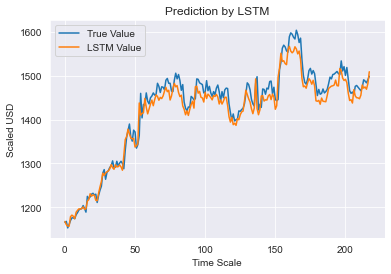

In [144]:
#Predicted vs True Adj Close Value – LSTM
plt.plot(y_test, label='True Value')
plt.plot(y_pred, label='LSTM Value')
plt.title("Prediction by LSTM")
plt.xlabel('Time Scale')
plt.ylabel('Scaled USD')
plt.legend()
plt.show()

In [145]:
features = stock_data3.drop(['Adj Close','Ticker'], axis = 1)
target = stock_data3['Adj Close']

In [146]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size = 0.3, random_state = 6)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(1682, 10)
(722, 10)
(1682,)
(722,)


In [147]:
X_train.head()

,Open,High,Low,Close,Volume,Daily price change,% daily price change,MA for 10 days,MA for 20 days,MA for 50 days
Date,,,,,,,,,,
2015-07-01,216.0,230.0,231.0,229.0,14824266,0.013274,5.676856,224.6,213.70,205.38
2020-12-18,900.0,919.0,925.0,907.0,18466344,-0.005482,0.771775,910.1,900.70,926.04
2022-12-05,1225.0,1238.0,1254.0,1236.0,14828536,-0.008026,0.889968,1209.5,1199.75,1149.68
2018-03-23,391.0,409.0,411.0,406.0,23469999,-0.009756,3.694581,411.9,416.35,419.88
2017-04-28,303.0,319.0,325.0,318.0,11848658,-0.009346,4.716981,316.7,312.50,291.00


In [148]:
X_train.columns

Index(['Open', 'High', 'Low', 'Close', 'Volume', 'Daily price change',
       '% daily price change', 'MA for 10 days', 'MA for 20 days',
       'MA for 50 days'],
      dtype='object')

In [149]:
from sklearn.preprocessing import MinMaxScaler
Scaler = MinMaxScaler()
X_train_scaled = Scaler.fit_transform(X_train)
X_test_scaled = Scaler.transform(X_test)

In [150]:
# Convert DataFrame to NumPy array before reshaping
X_train_array = np.array(X_train_scaled)  # Convert DataFrame to NumPy
X_test_array = np.array(X_test_scaled)    # Convert DataFrame to NumPy

# Reshape for LSTM (3D input: [samples, timesteps, features])
X_train_reshaped = X_train_array.reshape((X_train_array.shape[0], 1, X_train_array.shape[1]))
X_test_reshaped = X_test_array.reshape((X_test_array.shape[0], 1, X_test_array.shape[1]))


In [151]:
# Build Improved LSTM Model
lstm_model = Sequential([
    LSTM(128, return_sequences=True, activation='relu', input_shape=(1, X_train_reshaped.shape[2])),
    Dropout(0.2),  # Regularization to prevent overfitting
    LSTM(64, return_sequences=False, activation='relu'),
    Dropout(0.2),
    Dense(32, activation='relu'),
    Dense(1)  # Output layer (single continuous value for stock price)
])

In [152]:
import tensorflow as tf
# Compile Model with Adam Optimizer & Learning Rate Scheduling
lstm_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='mse')

In [153]:
# Train Model with Early Stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
history = lstm_model.fit(X_train_reshaped, y_train, epochs=100, batch_size=32, validation_data=(X_test_reshaped, y_test), callbacks=[early_stopping], verbose=1)

Epoch 1/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 699361.2500 - val_loss: 717917.1875
Epoch 2/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 650586.6250 - val_loss: 466603.7500
Epoch 3/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 271076.5000 - val_loss: 4639.3423
Epoch 4/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 13506.3496 - val_loss: 1553.7798
Epoch 5/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 7732.2935 - val_loss: 1763.1017
Epoch 6/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - loss: 8404.5801 - val_loss: 1513.8170
Epoch 7/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 9022.3125 - val_loss: 1483.9941
Epoch 8/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 8501.6621 - val_loss: 1424.6595
Epoch 9/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 9228.4395 - val_loss: 1454.1680
Epoch 10/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 8478.3203 - val_loss: 1356.1494
Epoch 11/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 8431.9473 - val

53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 6786.8672 - val_loss: 286.7732
Epoch 67/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 6971.2183 - val_loss: 676.8112
Epoch 68/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 7474.3960 - val_loss: 293.2912
Epoch 69/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 6989.5669 - val_loss: 301.5016
Epoch 70/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 6523.2163 - val_loss: 399.7511
Epoch 71/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 6980.5425 - val_loss: 307.5314
Epoch 72/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 7253.6025 - val_loss: 326.5539
Epoch 73/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 6684.5762 - val_loss: 577.0502
Epoch 74/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 6631.9683 - val_loss: 420.6642
Epoch 75/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 6127.3477 - val_loss: 294.3950
Epoch 76/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 6404.2695 - val_loss: 527.1967


In [154]:
#  Make Predictions
y_pred = lstm_model.predict(X_test_reshaped)

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step


In [155]:
# Evaluate Model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

In [156]:
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"R² Score: {r2:.4f}")


Mean Squared Error (MSE): 286.77
Root Mean Squared Error (RMSE): 16.93
R² Score: 0.9983


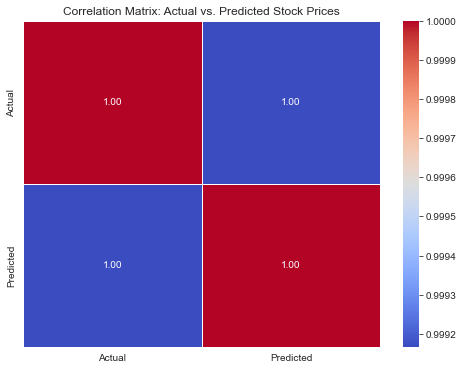

In [157]:
# Convert predictions and actual values to DataFrame
df_results = pd.DataFrame({'Actual': y_test.to_numpy().ravel(), 'Predicted': y_pred.ravel()})

# Create a Heatmap of Actual vs. Predicted Values
plt.figure(figsize=(8,6))
sns.heatmap(df_results.corr(), annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix: Actual vs. Predicted Stock Prices")
plt.show()


In [158]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np

# Initialize and Train Linear Regression Model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)  # Train on historical stock data

# Make Predictions on Test Data
y_pred_lr = lr_model.predict(X_test)

# Evaluate Model Performance
mse_lr = mean_squared_error(y_test, y_pred_lr)
rmse_lr = np.sqrt(mse_lr)
r2_lr = r2_score(y_test, y_pred_lr)
mae_lr = mean_absolute_error(y_test, y_pred_lr)

# Print Accuracy Metrics
print(f"Linear Regression Model Results:")
print(f"Mean Squared Error (MSE): {mse_lr:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse_lr:.2f}")
print(f"R² Score: {r2_lr:.4f}")
print(f"Mean Absolute Error (MAE): {mae_lr:.2f}")

# Compare with LSTM Performance
print("\nComparison with LSTM Model:")
print(f"LSTM R² Score: {r2:.4f} | Linear Regression R² Score: {r2_lr:.4f}")
print(f"LSTM RMSE: {rmse:.2f} | Linear Regression RMSE: {rmse_lr:.2f}")


Linear Regression Model Results:
Mean Squared Error (MSE): 22.31
Root Mean Squared Error (RMSE): 4.72
R² Score: 0.9999
Mean Absolute Error (MAE): 3.18

Comparison with LSTM Model:
LSTM R² Score: 0.9983 | Linear Regression R² Score: 0.9999
LSTM RMSE: 16.93 | Linear Regression RMSE: 4.72


In [159]:
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np

# Feature Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train SVM Model with Best Parameters
svr_model = SVR(kernel='rbf', C=10, gamma=0.1, epsilon=0.1)  
svr_model.fit(X_train_scaled, y_train)

# Predictions
y_pred_svr = svr_model.predict(X_test_scaled)

# Evaluate Model
mse_svr = mean_squared_error(y_test, y_pred_svr)
rmse_svr = np.sqrt(mse_svr)
r2_svr = r2_score(y_test, y_pred_svr)
mae_svr = mean_absolute_error(y_test, y_pred_svr)

# Print Results
print(f"SVM Model Results:")
print(f"Mean Squared Error (MSE): {mse_svr:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse_svr:.2f}")
print(f"R² Score: {r2_svr:.4f}")
print(f"Mean Absolute Error (MAE): {mae_svr:.2f}")

# Compare Models
print("\nComparison of Models:")
print(f"LSTM R² Score: {r2:.4f} | Linear Regression R² Score: {r2_lr:.4f} | SVM R² Score: {r2_svr:.4f}")
print(f"LSTM RMSE: {rmse:.2f} | Linear Regression RMSE: {rmse_lr:.2f} | SVM RMSE: {rmse_svr:.2f}")


SVM Model Results:
Mean Squared Error (MSE): 1979.94
Root Mean Squared Error (RMSE): 44.50
R² Score: 0.9884
Mean Absolute Error (MAE): 21.90

Comparison of Models:
LSTM R² Score: 0.9983 | Linear Regression R² Score: 0.9999 | SVM R² Score: 0.9884
LSTM RMSE: 16.93 | Linear Regression RMSE: 4.72 | SVM RMSE: 44.50


In [160]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np

# Initialize and Train Random Forest Model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)  # 100 trees in the forest
rf_model.fit(X_train, y_train)

# Make Predictions on Test Data
y_pred_rf = rf_model.predict(X_test)

# Evaluate Model Performance
mse_rf = mean_squared_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mse_rf)
r2_rf = r2_score(y_test, y_pred_rf)
mae_rf = mean_absolute_error(y_test, y_pred_rf)

# Print Accuracy Metrics
print(f"Random Forest Model Results:")
print(f"Mean Squared Error (MSE): {mse_rf:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse_rf:.2f}")
print(f"R² Score: {r2_rf:.4f}")
print(f"Mean Absolute Error (MAE): {mae_rf:.2f}")

# Compare Random Forest vs. LSTM vs. SVM vs. Linear Regression
print("\nModel Comparison:")
print(f"LSTM R² Score: {r2:.4f} | Linear Regression R² Score: {r2_lr:.4f} | SVM R² Score: {r2_svr:.4f} | Random Forest R² Score: {r2_rf:.4f}")
print(f"LSTM RMSE: {rmse:.2f} | Linear Regression RMSE: {rmse_lr:.2f} | SVM RMSE: {rmse_svr:.2f} | Random Forest RMSE: {rmse_rf:.2f}")


Random Forest Model Results:
Mean Squared Error (MSE): 43.09
Root Mean Squared Error (RMSE): 6.56
R² Score: 0.9997
Mean Absolute Error (MAE): 4.36

Model Comparison:
LSTM R² Score: 0.9983 | Linear Regression R² Score: 0.9999 | SVM R² Score: 0.9884 | Random Forest R² Score: 0.9997
LSTM RMSE: 16.93 | Linear Regression RMSE: 4.72 | SVM RMSE: 44.50 | Random Forest RMSE: 6.56


In [161]:
# Ensure y_test and y_pred are 1D arrays
y_test = np.ravel(y_test)  # Converts to 1D
y_pred = np.ravel(y_pred)
y_pred_lr = np.ravel(y_pred_lr)
y_pred_svr = np.ravel(y_pred_svr)
y_pred_rf = np.ravel(y_pred_rf)

In [162]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_absolute_error


# Calculate MAE for each model
mae = mean_absolute_error(y_test, y_pred)        # LSTM
mae_lr = mean_absolute_error(y_test, y_pred_lr)  # Linear Regression
mae_svr = mean_absolute_error(y_test, y_pred_svr)  # SVM
mae_rf = mean_absolute_error(y_test, y_pred_rf)  # Random Forest

# Function to Calculate Adjusted R² Score
def adjusted_r2(r2, n, k):
    return 1 - ((1 - r2) * (n - 1) / (n - k - 1))

# Calculate Adjusted R² Scores
n = len(y_test)  # Number of test samples
k = X_test.shape[1]  # Number of features

adj_r2_lstm = adjusted_r2(r2, n, k)
adj_r2_lr = adjusted_r2(r2_lr, n, k)
adj_r2_svr = adjusted_r2(r2_svr, n, k)
adj_r2_rf = adjusted_r2(r2_rf, n, k)

# Function to Calculate MAPE (Mean Absolute Percentage Error)
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mape_lstm = mean_absolute_percentage_error(y_test, y_pred)
mape_lr = mean_absolute_percentage_error(y_test, y_pred_lr)
mape_svr = mean_absolute_percentage_error(y_test, y_pred_svr)
mape_rf = mean_absolute_percentage_error(y_test, y_pred_rf)

# Create a DataFrame to Store Model Results
model_comparison = pd.DataFrame({
    "Model": ["LSTM", "Linear Regression", "SVM", "Random Forest"],
    "MSE": [mse, mse_lr, mse_svr, mse_rf],
    "RMSE": [rmse, rmse_lr, rmse_svr, rmse_rf],
    "MAE": [mae, mae_lr, mae_svr, mae_rf],
    "MAPE": [mape_lstm, mape_lr, mape_svr, mape_rf],
    "R²": [r2, r2_lr, r2_svr, r2_rf],
    "Adj_R²": [adj_r2_lstm, adj_r2_lr, adj_r2_svr, adj_r2_rf],
    "Accuracy (%)": [r2 * 100, r2_lr * 100, r2_svr * 100, r2_rf * 100]  # Using R² as an accuracy estimate
})

# Display the Comparison Table
print("\n📊 Model Performance Comparison Table:")
model_comparison.head()


📊 Model Performance Comparison Table:


,Model,MSE,RMSE,MAE,MAPE,R²,Adj_R²,Accuracy (%)
0,LSTM,286.773175,16.934378,12.879265,2.209712,0.998324,0.998300,99.832396
1,Linear Regression,22.314561,4.723829,3.184878,0.448677,0.999870,0.999868,99.986958
2,SVM,1979.941609,44.496535,21.898145,4.289230,0.988428,0.988266,98.842829
3,Random Forest,43.091753,6.564431,4.362078,0.626880,0.999748,0.999745,99.974815


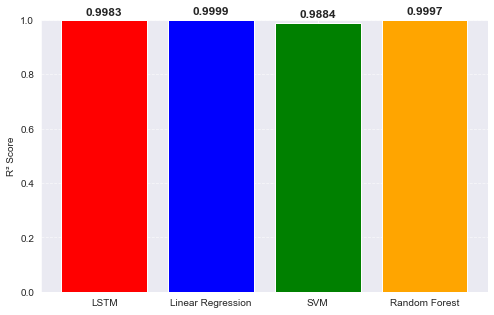

In [163]:
import matplotlib.pyplot as plt
import numpy as np

# Define Model Names and Their R² Scores
models = ['LSTM', 'Linear Regression', 'SVM', 'Random Forest']
r2_scores = [r2, r2_lr, r2_svr, r2_rf]  # Use previously computed R² scores

# Create the Bar Chart
plt.figure(figsize=(8,5))
plt.bar(models, r2_scores, color=['red', 'blue', 'green', 'orange'])

# Add Labels and Title
plt.ylabel("R² Score")
plt.ylim(0, 1)  # R² Score ranges from 0 to 1
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Display R² Values on Bars
for i, v in enumerate(r2_scores):
    plt.text(i, v + 0.02, f"{v:.4f}", ha='center', fontsize=12, fontweight='bold')

# Show the Graph
plt.show()


In [165]:
import pickle
file = open('stock_price_prediction.pkl', 'wb')
pickle.dump(lstm_model, file)